Para evitar el sobreajuste identificado en versiones previas, se incorporaron diversas estrategias de regularización:

Penalización L2 en todos los pesos (kernel_regularizer=l2(1e-3)).

Dropout y SpatialDropout2D (0.2–0.3) para reducir coadaptación entre neuronas y filtros.

Recurrent Dropout (0.2) en las capas ConvLSTM2D para regularizar los estados temporales.

Tasa de aprendizaje inicial baja (1e-4) con control del gradiente mediante clipnorm=1.0.

Pérdida Huber, más robusta frente a valores atípicos.

Esquema de aprendizaje adaptativo mediante cosine decay, ReduceLROnPlateau y EarlyStopping con restauración de los mejores pesos.

Estas modificaciones buscan equilibrar la capacidad de generalización y la estabilidad del entrenamiento, reduciendo la brecha entre las métricas de entrenamiento y validación observadas en los experimentos previos. En conjunto, el modelo ofrece una arquitectura más robusta y generalizable para tareas de predicción espacio-temporal basadas en secuencias de imágenes.

In [1]:
import tensorflow as tf
import gc

# Limpia los gráficos de TensorFlow en memoria
tf.keras.backend.clear_session()

# Fuerza la recolección de basura en Python
gc.collect()

print("✅ Memoria GPU liberada (parcialmente)")

2025-11-04 21:01:09.823367: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-11-04 21:01:09.839803: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2025-11-04 21:01:09.859709: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2025-11-04 21:01:09.865707: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-11-04 21:01:09.881499: I tensorflow/core/platform/cpu_feature_guar

✅ Memoria GPU liberada (parcialmente)


In [13]:
import os
import numpy as np
from PIL import Image
import tensorflow as tf
from sklearn.model_selection import train_test_split
from tensorflow.keras.models import Model
from tensorflow.keras.layers import (
    Input, ConvLSTM2D, Conv2D, TimeDistributed,
    Add, Activation, BatchNormalization, Dropout, SpatialDropout2D
)
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, LearningRateScheduler, ReduceLROnPlateau
from tensorflow.keras.metrics import RootMeanSquaredError, MeanAbsolutePercentageError
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.regularizers import l2
import matplotlib.pyplot as plt

# =====================================================
# FUNCIONES AUXILIARES
# =====================================================

def resize_npy_images(d_original, d_reducida, new_size=(260, 260)):
    print(f"Redimensionando imágenes en {d_original}...")

    if not os.path.exists(d_reducida):
        os.makedirs(d_reducida)

    processed_count = 0
    for filename in os.listdir(d_original):
        if filename.lower().endswith('.npy'):
            img_path = os.path.join(d_original, filename)
            img_array = np.load(img_path)
            img_resized = np.array(Image.fromarray(img_array).resize(new_size, Image.LANCZOS))
            output_path = os.path.join(d_reducida, filename)
            np.save(output_path, img_resized)
            processed_count += 1

    print(f"Procesadas {processed_count} imágenes")
    return processed_count
def mostrar_resultados(X, y, y_pred, n=5, cmap='viridis',
                       titulo_general="Comparación de Resultados",
                       xlabel="Eje X (pixeles)", ylabel="Eje Y (pixeles)"):
    n = min(n, len(X))

    fig, axs = plt.subplots(n, 3, figsize=(15, 5 * n))
    fig.suptitle(titulo_general, fontsize=16, y=1.02)

    for i in range(n):
        # Para X: si tiene timesteps, tomar el último (índice -1)
        if len(X[i].shape) > 2:  # Si tiene múltiples timesteps
            entrada = X[i, -1, ..., 0]  # Último timestep, banda 0
        else:
            entrada = X[i, ..., 0]  # Solo una imagen, banda 0
            
        axs[i, 0].imshow(entrada, cmap=cmap)
        axs[i, 0].set_title(f'Entrada t={i}')
        axs[i, 0].set_xlabel(xlabel)
        axs[i, 0].set_ylabel(ylabel)

        axs[i, 1].imshow(y[i, ..., 0], cmap=cmap)
        axs[i, 1].set_title(f'Real t+1={i+1}')
        axs[i, 1].set_xlabel(xlabel)
        axs[i, 1].set_ylabel(ylabel)

        axs[i, 2].imshow(y_pred[i, ..., 0], cmap=cmap)
        axs[i, 2].set_title(f'Predicción t+1={i+1}')
        axs[i, 2].set_xlabel(xlabel)
        axs[i, 2].set_ylabel(ylabel)

    plt.tight_layout()
    plt.show()

In [3]:

b13_original = '/home/jhon/bandas/banda13/ene_oct_10m'
b13_reducida = '/home/jhon/bandas/banda13/ene_oct_10m_260'

#Llamado de función para redimensionar imágenes
resize_npy_images(b13_original, b13_reducida, new_size=(260, 260))

# Cargar las imágenes
file13_list = sorted([f for f in os.listdir(b13_reducida) if f.endswith('.npy')])  # Lista y ordena los archivos .npy
print(f"Procesando {len(file13_list)} imágenes")  # Imprime la cantidad de imágenes procesadas

b13_images = [np.load(os.path.join(b13_reducida, f)) for f in file13_list]  # Carga los arrays de las imágenes seleccionadas
# Normalización
all13_pixels = np.concatenate([img.flatten() for img in b13_images])
global13_min, global13_max = np.min(all13_pixels), np.max(all13_pixels)

b13_images = [(img - global13_min) / (global13_max - global13_min + 1e-8) for img in b13_images]
b13_images = [np.clip(img, 0, 1) for img in b13_images]

# Construir secuencias temporales
print("\nConstruyendo secuencias temporales...")
b13_timesteps = 3

X13_base = np.array(b13_images)[..., np.newaxis]
y13_base = X13_base.copy()

N13_seq = X13_base.shape[0] - b13_timesteps
X13_seq = np.array([X13_base[i:i+b13_timesteps] for i in range(N13_seq)])
y13_seq = y13_base[b13_timesteps:]

print(f"✅ Secuencias creadas:")
print(f"   - Forma de X_seq: {X13_seq.shape}")
print(f"   - Forma de y_seq: {y13_seq.shape}")
print(f"   - Número de secuencias: {N13_seq}")


Redimensionando imágenes en /home/jhon/bandas/banda13/ene_oct_10m...
Procesadas 7250 imágenes
Procesando 7250 imágenes

Construyendo secuencias temporales...
✅ Secuencias creadas:
   - Forma de X_seq: (7247, 3, 260, 260, 1)
   - Forma de y_seq: (7247, 260, 260, 1)
   - Número de secuencias: 7247


In [4]:

b9_original = '/home/jhon/bandas/banda9/ene_oct_10m'
b9_reducida = '/home/jhon/bandas/banda9/ene_oct_10m_260'

#Llamado de función para redimensionar imágenes
resize_npy_images(b9_original, b9_reducida, new_size=(260, 260))

# Cargar las imágenes
file9_list = sorted([f for f in os.listdir(b9_reducida) if f.endswith('.npy')])  # Lista y ordena los archivos .npy
print(f"Procesando {len(file9_list)} imágenes")  # Imprime la cantidad de imágenes procesadas

b9_images = [np.load(os.path.join(b9_reducida, f)) for f in file9_list]  # Carga los arrays de las imágenes seleccionadas
# Normalización
all9_pixels = np.concatenate([img.flatten() for img in b9_images])
global9_min, global9_max = np.min(all9_pixels), np.max(all9_pixels)

b9_images = [(img - global9_min) / (global9_max - global9_min + 1e-8) for img in b9_images]
b9_images = [np.clip(img, 0, 1) for img in b9_images]

# Construir secuencias temporales
print("\nConstruyendo secuencias temporales...")
b9_timesteps = 3

X9_base = np.array(b9_images)[..., np.newaxis]
y9_base = X9_base.copy()

N9_seq = X9_base.shape[0] - b9_timesteps
X9_seq = np.array([X9_base[i:i+b9_timesteps] for i in range(N9_seq)])
y9_seq = y9_base[b9_timesteps:]

print(f"✅ Secuencias creadas:")
print(f"   - Forma de X_seq: {X9_seq.shape}")
print(f"   - Forma de y_seq: {y9_seq.shape}")
print(f"   - Número de secuencias: {N9_seq}")


Redimensionando imágenes en /home/jhon/bandas/banda9/ene_oct_10m...
Procesadas 7250 imágenes
Procesando 7250 imágenes

Construyendo secuencias temporales...
✅ Secuencias creadas:
   - Forma de X_seq: (7247, 3, 260, 260, 1)
   - Forma de y_seq: (7247, 260, 260, 1)
   - Número de secuencias: 7247


In [5]:
# =====================================================
# CONCATENAR AMBOS CANALES
# =====================================================
X_multi = np.concatenate([X13_seq, X9_seq], axis=-1)  # (n,t, 260, 260, 2)
y_multi = np.concatenate([y13_seq, y9_seq], axis=-1)  # (n,t, 260, 260, 2)


print("Forma de X multi", X_multi.shape)
print("Forma de y multi:", y_multi.shape)

Forma de X multi (7247, 3, 260, 260, 2)
Forma de y multi: (7247, 260, 260, 2)


In [6]:
# =====================================================
# PARÁMETROS GENERALES
# =====================================================
H, W, C = X_multi.shape[2], X_multi.shape[3], X_multi.shape[4]
timesteps = X_multi.shape[1]
semilla = 42
tf.random.set_seed(semilla)

# =====================================================
# FUNCIÓN DE DECAY COSENO
# =====================================================
initial_lr = 1e-4       # LR máximo
min_lr = 1e-6           # LR mínimo
epochs_total = 50       # Total de épocas
warmup_epochs = 5       # Épocas de "calentamiento"

def cosine_decay_schedule(epoch, lr):
    if epoch < warmup_epochs:
        return initial_lr
    progress = (epoch - warmup_epochs) / (epochs_total - warmup_epochs)
    progress = np.clip(progress, 0, 1)
    cosine_decay = 0.5 * (1 + np.cos(np.pi * progress))
    return min_lr + (initial_lr - min_lr) * cosine_decay

# =====================================================
# CONSTRUCCIÓN DEL MODELO
# =====================================================
inputs = Input(shape=(timesteps, H, W, C), name='input_sequence')

# === BLOQUE 1 ===
block1_conv3x3 = ConvLSTM2D(
    16, (3, 3), padding='same', return_sequences=True,
    kernel_regularizer=l2(1e-3), recurrent_dropout=0.2)(inputs)
block1_conv3x3 = TimeDistributed(BatchNormalization())(block1_conv3x3)
block1_conv3x3 = Activation('relu')(block1_conv3x3)
block1_conv3x3 = TimeDistributed(SpatialDropout2D(0.2))(block1_conv3x3)

block1_conv5x5 = ConvLSTM2D(
    16, (5, 5), padding='same', return_sequences=True,
    kernel_regularizer=l2(1e-3), recurrent_dropout=0.2)(inputs)
block1_conv5x5 = TimeDistributed(BatchNormalization())(block1_conv5x5)
block1_conv5x5 = Activation('relu')(block1_conv5x5)
block1_conv5x5 = TimeDistributed(SpatialDropout2D(0.2))(block1_conv5x5)

block1 = Add()([block1_conv3x3, block1_conv5x5])
block1 = Activation('relu')(block1)
block1 = Dropout(0.3)(block1)

# === BLOQUE 2 (Residual) ===
residual = block1

block2_conv3x3 = ConvLSTM2D(
    16, (3, 3), padding='same', return_sequences=True,
    kernel_regularizer=l2(1e-3), recurrent_dropout=0.2)(block1)
block2_conv3x3 = TimeDistributed(BatchNormalization())(block2_conv3x3)
block2_conv3x3 = Activation('relu')(block2_conv3x3)
block2_conv3x3 = TimeDistributed(SpatialDropout2D(0.2))(block2_conv3x3)

block2_conv5x5 = ConvLSTM2D(
    16, (5, 5), padding='same', return_sequences=True,
    kernel_regularizer=l2(1e-3), recurrent_dropout=0.2)(block1)
block2_conv5x5 = TimeDistributed(BatchNormalization())(block2_conv5x5)
block2_conv5x5 = Activation('relu')(block2_conv5x5)
block2_conv5x5 = TimeDistributed(SpatialDropout2D(0.2))(block2_conv5x5)

block2 = Add()([block2_conv3x3, block2_conv5x5, residual])
block2 = Activation('relu')(block2)
block2 = Dropout(0.3)(block2)

# === BLOQUE 3 ===
block3_conv3x3 = ConvLSTM2D(
    16, (3, 3), padding='same', return_sequences=True,
    kernel_regularizer=l2(1e-3), recurrent_dropout=0.2)(block2)
block3_conv3x3 = TimeDistributed(BatchNormalization())(block3_conv3x3)
block3_conv3x3 = Activation('relu')(block3_conv3x3)

block3_conv5x5 = ConvLSTM2D(
    16, (5, 5), padding='same', return_sequences=True,
    kernel_regularizer=l2(1e-3), recurrent_dropout=0.2)(block2)
block3_conv5x5 = TimeDistributed(BatchNormalization())(block3_conv5x5)
block3_conv5x5 = Activation('relu')(block3_conv5x5)

block3 = Add()([block3_conv3x3, block3_conv5x5])
block3 = Activation('relu')(block3)
block3 = Dropout(0.3)(block3)

# === CAPA FINAL ===
final_convLSTM = ConvLSTM2D(
    16, (3, 3), padding='same', return_sequences=False,
    kernel_regularizer=l2(1e-3), recurrent_dropout=0.2)(block3)

outputs = Conv2D(1, (1, 1), padding='same', activation='linear')(final_convLSTM)

model17_2b = Model(inputs=inputs, outputs=outputs, name='ConvLSTM17_2_Bandas')

# =====================================================
# COMPILACIÓN Y CALLBACKS
# =====================================================
optimizer = Adam(learning_rate=initial_lr)
model17_2b.compile(
    optimizer=optimizer,
    loss=tf.keras.losses.Huber(),
    metrics=[RootMeanSquaredError(), MeanAbsolutePercentageError()]
)

class ClearMemory(tf.keras.callbacks.Callback):
    def on_epoch_end(self, epoch, logs=None):
        import gc, tensorflow as tf
        gc.collect()
        tf.keras.backend.clear_session()
        print(f"\n🧹 Memoria liberada tras la época {epoch+1}")

callbacks = [
    EarlyStopping(monitor='val_loss', patience=8, restore_best_weights=True, verbose=1),
    ModelCheckpoint(filepath="modelo17_2b_260_best.h5", monitor="val_loss", save_best_only=True, mode="min", verbose=1),
    LearningRateScheduler(cosine_decay_schedule, verbose=1),
    ClearMemory()
]

print("✅ Modelo 17 con dos bandas")
model17_2b.summary()

# =====================================================
# DIVISIÓN DE DATOS
# =====================================================
print("\n" + "=" * 50)
print("DIVISIÓN DE DATOS")
print("=" * 50)

porc_validacion = 0.2
split_index = int(len(X_multi) * (1 - porc_validacion))

X_train, X_val = X_multi[:split_index], X_multi[split_index:]
y_train, y_val = y_multi[:split_index], y_multi[split_index:]

X_train = np.array(X_train, dtype=np.float32)
y_train = np.array(y_train, dtype=np.float32)

print(f"✅ Datos divididos:")
print(f"   - Entrenamiento: {len(X_train)} muestras")
print(f"   - Validación: {len(X_val)} muestras")

# =====================================================
# ENTRENAMIENTO
# =====================================================
print("\n" + "=" * 50)
print("INICIANDO ENTRENAMIENTO")
print("=" * 50)

history17_2b = model17_2b.fit(
    X_train, y_train,
    validation_data=(X_val, y_val),
    epochs=epochs_total,
    batch_size=1,
    callbacks=callbacks,
    verbose=1
)

print("✅ ¡Entrenamiento completado!")

# =====================================================
# RESULTADOS
# =====================================================
print("\n" + "=" * 50)
print("RESULTADOS DEL ENTRENAMIENTO")
print("=" * 50)

final_train_loss = history17_2b.history['loss'][-1]
final_val_loss = history17_2b.history['val_loss'][-1]
best_epoch = np.argmin(history17_2b.history['val_loss']) + 1

print(f"📊 Resultados finales:")
print(f"   - Pérdida final entrenamiento: {final_train_loss:.4f}")
print(f"   - Pérdida final validación: {final_val_loss:.4f}")
print(f"   - Mejor época: {best_epoch}")

print("\n🎯 ¡Proceso completado! Modelo guardado: modelo17_2b_best.keras")


2025-11-04 21:16:20.593894: I tensorflow/core/common_runtime/gpu/gpu_device.cc:2021] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 46755 MB memory:  -> device: 0, name: NVIDIA RTX A6000, pci bus id: 0000:52:00.0, compute capability: 8.6


✅ Modelo 17 con dos bandas


Model: "ConvLSTM17_2_Bandas"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_sequence      │ (None, 3, 260,    │          0 │ -                 │
│ (InputLayer)        │ 260, 2)           │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv_lstm2d         │ (None, 3, 260,    │     10,432 │ input_sequence[0… │
│ (ConvLSTM2D)        │ 260, 16)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv_lstm2d_1       │ (None, 3, 260,    │     28,864 │ input_sequence[0… │
│ (ConvLSTM2D)        │ 260, 16)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ time_distributed    │ (None, 3, 260,    │         64 │ conv_lstm2d[0][0] │
│ (TimeDistributed)   │ 260, 16)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ time_distributed_2  │ (None, 3, 260,    │         64 │ conv_lstm2d_1[0]… │
│ (TimeDistributed)   │ 260, 16)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation          │ (None, 3, 260,    │          0 │ time_distributed… │
│ (Activation)        │ 260, 16)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_1        │ (None, 3, 260,    │          0 │ time_distributed… │
│ (Activation)        │ 260, 16)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ time_distributed_1  │ (None, 3, 260,    │          0 │ activation[0][0]  │
│ (TimeDistributed)   │ 260, 16)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ time_distributed_3  │ (None, 3, 260,    │          0 │ activation_1[0][… │
│ (TimeDistributed)   │ 260, 16)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add (Add)           │ (None, 3, 260,    │          0 │ time_distributed… │
│                     │ 260, 16)          │            │ time_distributed… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_2        │ (None, 3, 260,    │          0 │ add[0][0]         │
│ (Activation)        │ 260, 16)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout (Dropout)   │ (None, 3, 260,    │          0 │ activation_2[0][… │
│                     │ 260, 16)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv_lstm2d_2       │ (None, 3, 260,    │     18,496 │ dropout[0][0]     │
│ (ConvLSTM2D)        │ 260, 16)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv_lstm2d_3       │ (None, 3, 260,    │     51,264 │ dropout[0][0]     │
│ (ConvLSTM2D)        │ 260, 16)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ time_distributed_4  │ (None, 3, 260,    │         64 │ conv_lstm2d_2[0]… │
│ (TimeDistributed)   │ 260, 16)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ time_distributed_6  │ (None, 3, 260,    │         64 │ conv_lstm2d_3[0]… │
│ (TimeDistributed)   │ 260, 16)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_3        │ (None, 3, 260,    │          0 │ time_distributed

 Total params: 197,713 (772.32 KB)

 Trainable params: 197,521 (771.57 KB)

 Non-trainable params: 192 (768.00 B)


DIVISIÓN DE DATOS
✅ Datos divididos:
   - Entrenamiento: 5797 muestras
   - Validación: 1450 muestras

INICIANDO ENTRENAMIENTO

Epoch 1: LearningRateScheduler setting learning rate to 0.0001.
Epoch 1/50


I0000 00:00:1762309010.540708  108509 service.cc:146] XLA service 0x132095140 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1762309010.540737  108509 service.cc:154]   StreamExecutor device (0): NVIDIA RTX A6000, Compute Capability 8.6
2025-11-04 21:16:51.454267: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:268] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2025-11-04 21:16:52.697637: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:531] Loaded cuDNN version 8907


   2/5797 ━━━━━━━━━━━━━━━━━━━━ 5:25 56ms/step - loss: 0.3970 - mean_absolute_percentage_error: 144.9149 - root_mean_squared_error: 0.7244   

I0000 00:00:1762309029.838346  108509 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


5797/5797 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step - loss: 0.0540 - mean_absolute_percentage_error: 30.0997 - root_mean_squared_error: 0.1416
Epoch 1: val_loss improved from None to 0.00691, saving model to modelo17_2b_260_best.h5



🧹 Memoria liberada tras la época 1
5797/5797 ━━━━━━━━━━━━━━━━━━━━ 367s 59ms/step - loss: 0.0238 - mean_absolute_percentage_error: 23.2654 - root_mean_squared_error: 0.1081 - val_loss: 0.0069 - val_mean_absolute_percentage_error: 26.3078 - val_root_mean_squared_error: 0.0964 - learning_rate: 1.0000e-04

Epoch 2: LearningRateScheduler setting learning rate to 0.0001.
Epoch 2/50
5797/5797 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step - loss: 0.0052 - mean_absolute_percentage_error: 19.7117 - root_mean_squared_error: 0.0862
Epoch 2: val_loss improved from 0.00691 to 0.00548, saving model to modelo17_2b_260_best.h5



🧹 Memoria liberada tras la época 2
5797/5797 ━━━━━━━━━━━━━━━━━━━━ 360s 62ms/step - loss: 0.0047 - mean_absolute_percentage_error: 19.0812 - root_mean_squared_error: 0.0851 - val_loss: 0.0055 - val_mean_absolute_percentage_error: 30.5971 - val_root_mean_squared_error: 0.0992 - learning_rate: 1.0000e-04

Epoch 3: LearningRateScheduler setting learning rate to 0.0001.
Epoch 3/50
5797/5797 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step - loss: 0.0039 - mean_absolute_percentage_error: 18.8502 - root_mean_squared_error: 0.0830
Epoch 3: val_loss improved from 0.00548 to 0.00492, saving model to modelo17_2b_260_best.h5



🧹 Memoria liberada tras la época 3
5797/5797 ━━━━━━━━━━━━━━━━━━━━ 359s 62ms/step - loss: 0.0038 - mean_absolute_percentage_error: 18.3999 - root_mean_squared_error: 0.0825 - val_loss: 0.0049 - val_mean_absolute_percentage_error: 27.6026 - val_root_mean_squared_error: 0.0957 - learning_rate: 1.0000e-04

Epoch 4: LearningRateScheduler setting learning rate to 0.0001.
Epoch 4/50
5797/5797 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step - loss: 0.0037 - mean_absolute_percentage_error: 18.4607 - root_mean_squared_error: 0.0818
Epoch 4: val_loss improved from 0.00492 to 0.00443, saving model to modelo17_2b_260_best.h5



🧹 Memoria liberada tras la época 4
5797/5797 ━━━━━━━━━━━━━━━━━━━━ 360s 62ms/step - loss: 0.0036 - mean_absolute_percentage_error: 18.0597 - root_mean_squared_error: 0.0815 - val_loss: 0.0044 - val_mean_absolute_percentage_error: 24.7519 - val_root_mean_squared_error: 0.0912 - learning_rate: 1.0000e-04

Epoch 5: LearningRateScheduler setting learning rate to 0.0001.
Epoch 5/50
5797/5797 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step - loss: 0.0035 - mean_absolute_percentage_error: 18.2267 - root_mean_squared_error: 0.0810
Epoch 5: val_loss did not improve from 0.00443

🧹 Memoria liberada tras la época 5
5797/5797 ━━━━━━━━━━━━━━━━━━━━ 359s 62ms/step - loss: 0.0035 - mean_absolute_percentage_error: 17.8460 - root_mean_squared_error: 0.0807 - val_loss: 0.0076 - val_mean_absolute_percentage_error: 26.5027 - val_root_mean_squared_error: 0.1213 - learning_rate: 1.0000e-04

Epoch 6: LearningRateScheduler setting learning rate to 0.0001.
Epoch 6/50
5797/5797 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step - loss: 0.0035

RESUMEN DE MÉTRICAS
Entrenamiento - Loss final: 0.0033, RMSE final: 0.0787, MAPE final: 17.2961
Validación    - Loss final: 0.0077, RMSE final: 0.1226, MAPE final: 24.6861


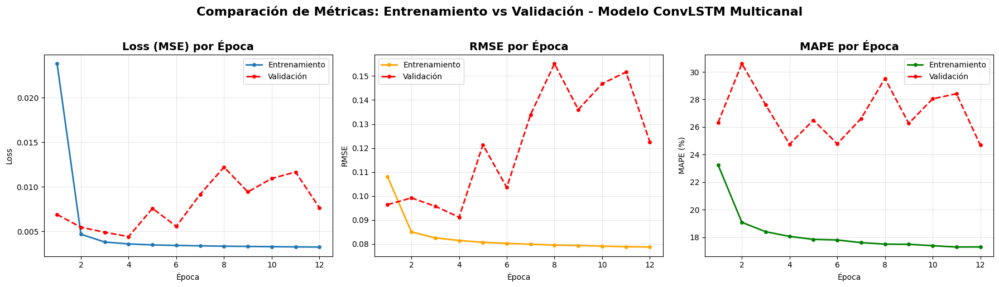

In [7]:

# Extraer métricas del historial (entrenamiento y validación)
loss = history17_2b.history['loss']
val_loss = history17_2b.history['val_loss']

rmse = history17_2b.history['root_mean_squared_error']
val_rmse = history17_2b.history['val_root_mean_squared_error']

mape = history17_2b.history['mean_absolute_percentage_error']
val_mape = history17_2b.history['val_mean_absolute_percentage_error']

epochs = range(1, len(loss) + 1)

# Mostrar resumen final
print("=" * 50)
print("RESUMEN DE MÉTRICAS")
print("=" * 50)
print(f"Entrenamiento - Loss final: {loss[-1]:.4f}, RMSE final: {rmse[-1]:.4f}, MAPE final: {mape[-1]:.4f}")
print(f"Validación    - Loss final: {val_loss[-1]:.4f}, RMSE final: {val_rmse[-1]:.4f}, MAPE final: {val_mape[-1]:.4f}")
print("=" * 50)

# =============================================================================
# VISUALIZACIÓN DE MÉTRICAS
# =============================================================================

plt.figure(figsize=(18, 5))

# Gráfico 1: Loss (MSE)
plt.subplot(1, 3, 1)
plt.plot(epochs, loss, marker='o', label='Entrenamiento', linewidth=2, markersize=4)
plt.plot(epochs, val_loss, marker='o', linestyle='--', color='red', linewidth=2, markersize=4, label='Validación')
plt.title('Loss (MSE) por Época', fontsize=14, fontweight='bold')
plt.xlabel('Época')
plt.ylabel('Loss')
plt.grid(True, alpha=0.3)
plt.legend()

# Gráfico 2: RMSE
plt.subplot(1, 3, 2)
plt.plot(epochs, rmse, marker='o', color='orange', label='Entrenamiento', linewidth=2, markersize=4)
plt.plot(epochs, val_rmse, marker='o', linestyle='--', color='red', linewidth=2, markersize=4, label='Validación')
plt.title('RMSE por Época', fontsize=14, fontweight='bold')
plt.xlabel('Época')
plt.ylabel('RMSE')
plt.grid(True, alpha=0.3)
plt.legend()

# Gráfico 3: MAPE
plt.subplot(1, 3, 3)
plt.plot(epochs, mape, marker='o', color='green', label='Entrenamiento', linewidth=2, markersize=4)
plt.plot(epochs, val_mape, marker='o', linestyle='--', color='red', linewidth=2, markersize=4, label='Validación')
plt.title('MAPE por Época', fontsize=14, fontweight='bold')
plt.xlabel('Época')
plt.ylabel('MAPE (%)')
plt.grid(True, alpha=0.3)
plt.legend()

plt.suptitle('Comparación de Métricas: Entrenamiento vs Validación - Modelo ConvLSTM Multicanal',
             fontsize=16, fontweight='bold', y=1.02)
plt.tight_layout()
plt.show()

In [8]:
# Obtener las métricas del modelo en el conjunto de entrenamiento
loss, rmse, mape = model17_2b.evaluate(X_train, y_train, verbose=1)
print(f"Pérdida (MSE): {loss:.4f}")
print(f"RMSE: {rmse:.4f}")
print(f"MAPE: {mape:.4f}")

182/182 ━━━━━━━━━━━━━━━━━━━━ 65s 326ms/step - loss: 0.0036 - mean_absolute_percentage_error: 18.2830 - root_mean_squared_error: 0.0813
Pérdida (MSE): 0.0036
RMSE: 0.0813
MAPE: 18.2830


In [9]:
# Obtener las métricas del modelo en el conjunto de validación
loss, rmse, mape = model17_2b.evaluate(X_val, y_val, verbose=1)
print(f"Pérdida (MSE): {loss:.4f}")
print(f"RMSE: {rmse:.4f}")
print(f"MAPE: {mape:.4f}")

46/46 ━━━━━━━━━━━━━━━━━━━━ 18s 381ms/step - loss: 0.0044 - mean_absolute_percentage_error: 24.7519 - root_mean_squared_error: 0.0912
Pérdida (MSE): 0.0044
RMSE: 0.0912
MAPE: 24.7519


182/182 ━━━━━━━━━━━━━━━━━━━━ 55s 300ms/step


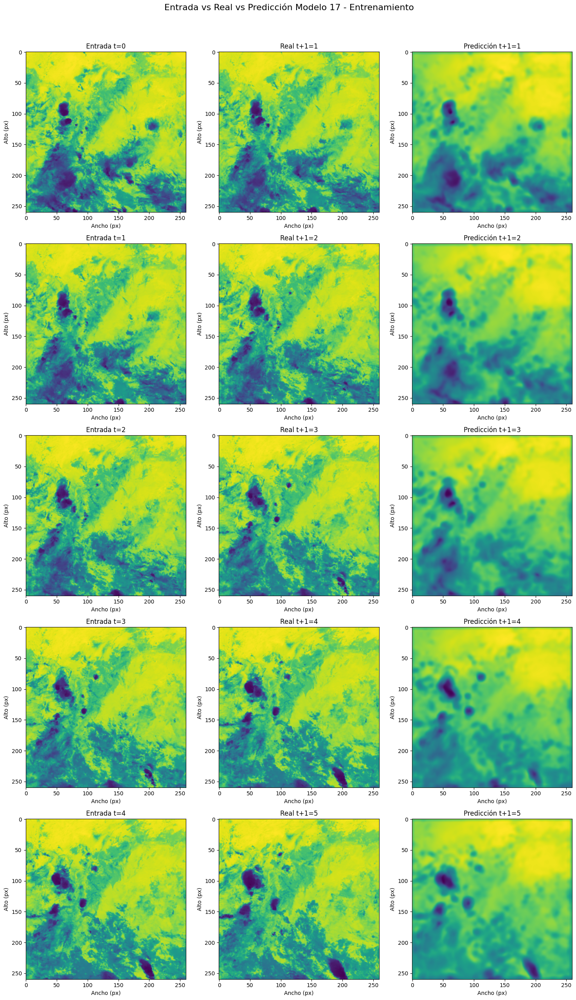

In [14]:
y_pred17_2b = model17_2b.predict(X_train)  # Genera las predicciones
mostrar_resultados(
    X_train, y_train, y_pred17_2b, n=5,
    titulo_general="Entrada vs Real vs Predicción Modelo 17 - Entrenamiento",
    xlabel="Ancho (px)", ylabel="Alto (px)"
)

Prueba

In [15]:
b13_prueba = '/home/jhon/bandas/banda13/nov_dic_2m'
b13_preuba_red = '/home/jhon/bandas/banda13/nov_dic_2m_260'

#Llamado de función para redimensionar imágenes
resize_npy_images(b13_prueba, b13_preuba_red, new_size=(260, 260))

# Cargar las imágenes
file_list = sorted([f for f in os.listdir(b13_preuba_red) if f.endswith('.npy')])  # Lista y ordena los archivos .npy
print(f"Procesando {len(file_list)} imágenes")  # Imprime la cantidad de imágenes procesadas

b13_prueba_images = [np.load(os.path.join(b13_preuba_red, f)) for f in file_list]  # Carga los arrays de las imágenes seleccionadas
# Normalización
all_pixels = np.concatenate([img.flatten() for img in b13_prueba_images])
global_min, global_max = np.min(all_pixels), np.max(all_pixels)

b13_prueba_images = [(img - global_min) / (global_max - global_min + 1e-8) for img in b13_prueba_images]
b13_prueba_images = [np.clip(img, 0, 1) for img in b13_prueba_images]

# Construir secuencias temporales
print("\nConstruyendo secuencias temporales...")
b13_prueba_timesteps = 3

X13_base = np.array(b13_prueba_images)[..., np.newaxis]
y13_base = X13_base.copy()

N13_prueba_seq = X13_base.shape[0] - b13_prueba_timesteps
X13_prueba_seq = np.array([X13_base[i:i+b13_prueba_timesteps] for i in range(N13_prueba_seq)])
y13_prueba_seq = y13_base[b13_prueba_timesteps:]

print(f"✅ Secuencias creadas:")
print(f"   - Forma de X_seq: {X13_prueba_seq.shape}")
print(f"   - Forma de y_seq: {y13_prueba_seq.shape}")
print(f"   - Número de secuencias: {N13_prueba_seq}")


Redimensionando imágenes en /home/jhon/bandas/banda13/nov_dic_2m...
Procesadas 1447 imágenes
Procesando 1447 imágenes

Construyendo secuencias temporales...
✅ Secuencias creadas:
   - Forma de X_seq: (1444, 3, 260, 260, 1)
   - Forma de y_seq: (1444, 260, 260, 1)
   - Número de secuencias: 1444


In [16]:
b9_prueba = '/home/jhon/bandas/banda9/nov_dic_2m'
b9_preuba_red = '/home/jhon/bandas/banda9/nov_dic_2m_260'

#Llamado de función para redimensionar imágenes
resize_npy_images(b9_prueba, b9_preuba_red, new_size=(260, 260))

# Cargar las imágenes
file_list = sorted([f for f in os.listdir(b9_preuba_red) if f.endswith('.npy')])  # Lista y ordena los archivos .npy
print(f"Procesando {len(file_list)} imágenes")  # Imprime la cantidad de imágenes procesadas

b9_prueba_images = [np.load(os.path.join(b9_preuba_red, f)) for f in file_list]  # Carga los arrays de las imágenes seleccionadas
# Normalización
all_pixels = np.concatenate([img.flatten() for img in b13_prueba_images])
global_min, global_max = np.min(all_pixels), np.max(all_pixels)

b9_prueba_images = [(img - global_min) / (global_max - global_min + 1e-8) for img in b9_prueba_images]
b9_prueba_images = [np.clip(img, 0, 1) for img in b9_prueba_images]

# Construir secuencias temporales
print("\nConstruyendo secuencias temporales...")
b9_prueba_timesteps = 3

X9_base = np.array(b9_prueba_images)[..., np.newaxis]
y9_base = X9_base.copy()

N9_prueba_seq = X9_base.shape[0] - b9_prueba_timesteps
X9_prueba_seq = np.array([X9_base[i:i+b9_prueba_timesteps] for i in range(N9_prueba_seq)])
y9_prueba_seq = y9_base[b9_prueba_timesteps:]

print(f"✅ Secuencias creadas:")
print(f"   - Forma de X_seq: {X9_prueba_seq.shape}")
print(f"   - Forma de y_seq: {y9_prueba_seq.shape}")
print(f"   - Número de secuencias: {N9_prueba_seq}")


Redimensionando imágenes en /home/jhon/bandas/banda9/nov_dic_2m...
Procesadas 1447 imágenes
Procesando 1447 imágenes

Construyendo secuencias temporales...
✅ Secuencias creadas:
   - Forma de X_seq: (1444, 3, 260, 260, 1)
   - Forma de y_seq: (1444, 260, 260, 1)
   - Número de secuencias: 1444


In [17]:
# Combinar ambos conjuntos de datos
X_multi_test = np.concatenate([X13_prueba_seq, X9_prueba_seq], axis=-1)
y_multi_test= np.concatenate([y13_prueba_seq, y9_prueba_seq], axis=-1)

print("Forma de X multi test", X_multi_test.shape)
print("Forma de y multi test:", y_multi_test.shape)

Forma de X multi test (1444, 3, 260, 260, 2)
Forma de y multi test: (1444, 260, 260, 2)


In [18]:
# evaluar el modelo
loss, rmse, mape = model17_2b.evaluate(X_multi_test, y_multi_test, verbose=1)
print(f"Pérdida (MSE): {loss:.4f}")
print(f"RMSE: {rmse:.4f}")
print(f"MAPE: {mape:.4f}")

46/46 ━━━━━━━━━━━━━━━━━━━━ 17s 363ms/step - loss: 0.0471 - mean_absolute_percentage_error: 90.6662 - root_mean_squared_error: 0.3060
Pérdida (MSE): 0.0471
RMSE: 0.3060
MAPE: 90.6662


46/46 ━━━━━━━━━━━━━━━━━━━━ 14s 295ms/step


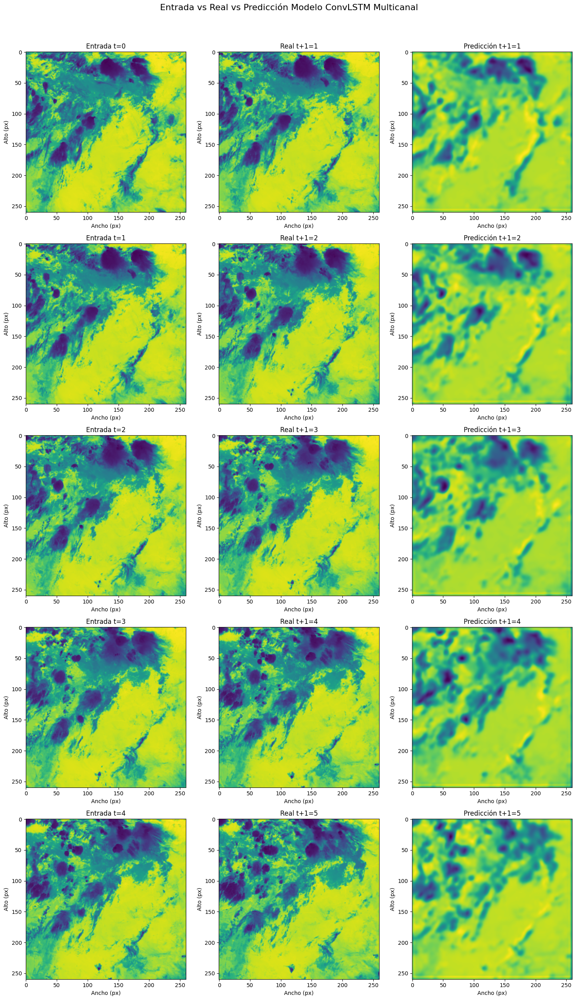

In [20]:
y_pred17_test_2b = model17_2b.predict(X_multi_test)
mostrar_resultados(
    X_multi_test,          # Pasar el COMPLETO (con todos los timesteps)
    y_multi_test,          # Valores reales
    y_pred17_test_2b,      # Predicciones
    n=5,
    titulo_general="Entrada vs Real vs Predicción Modelo ConvLSTM Multicanal",
    xlabel="Ancho (px)",
    ylabel="Alto (px)"
)